In [1]:
import pandas as pd
import numpy as np 

In [2]:
df = pd.read_csv('Covid19CountyStatisticsHPSCIreland.csv', parse_dates=['TimeStamp'])

In [3]:
df.head()

,OBJECTID,ORIGID,CountyName,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,ConfirmedCovidCases,PopulationProportionCovidCases,ConfirmedCovidDeaths,ConfirmedCovidRecovered,Shape__Area,Shape__Length
0,1,1,Carlow,56932,2020-02-27 00:00:00+00:00,278661,163444,52.7168,-6.8367,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,2.432352e+09,3.193486e+05
1,2,2,Cavan,76176,2020-02-27 00:00:00+00:00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,5.575010e+09,5.159545e+05
2,3,3,Clare,118817,2020-02-27 00:00:00+00:00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,8.722542e+09,1.013949e+06
3,4,4,Cork,542868,2020-02-27 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.952949e+10,2.129949e+06
4,5,5,Donegal,159192,2020-02-27 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.462404e+10,2.145086e+06


In [4]:
df.tail()

,OBJECTID,ORIGID,CountyName,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,ConfirmedCovidCases,PopulationProportionCovidCases,ConfirmedCovidDeaths,ConfirmedCovidRecovered,Shape__Area,Shape__Length
13495,13496,2,Cavan,76176,2021-08-01 00:00:00+00:00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,5785,7594.255409,NaN,NaN,5.575010e+09,5.159545e+05
13496,13497,3,Clare,118817,2021-08-01 00:00:00+00:00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,5614,4724.913102,NaN,NaN,8.722542e+09,1.013949e+06
13497,13498,4,Cork,542868,2021-08-01 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,26325,4849.245120,NaN,NaN,1.952949e+10,2.129949e+06
13498,13499,5,Donegal,159192,2021-08-01 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,14236,8942.660435,NaN,NaN,1.462404e+10,2.145086e+06
13499,13500,6,Dublin,1347359,2021-08-01 00:00:00+00:00,313762,235813,53.3605,-6.2920,http://data.geohive.ie/resource/county/2ae1962...,107156,7953.039984,NaN,NaN,2.612633e+09,4.494335e+05


In [5]:
df.shape


(13500, 16)

In [6]:
df.PopulationCensus16.nunique()

26

In [7]:
df.rename(columns={'CountyName':'County','ConfirmedCovidCases':'Confirmed','PopulationProportionCovidCases':'Proportion',
                   'ConfirmedCovidDeaths':'Deaths','ConfirmedCovidRecovered':'Recovered'},inplace=True)

In [8]:
df

,OBJECTID,ORIGID,County,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length
0,1,1,Carlow,56932,2020-02-27 00:00:00+00:00,278661,163444,52.7168,-6.8367,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,2.432352e+09,3.193486e+05
1,2,2,Cavan,76176,2020-02-27 00:00:00+00:00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,5.575010e+09,5.159545e+05
2,3,3,Clare,118817,2020-02-27 00:00:00+00:00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,8.722542e+09,1.013949e+06
3,4,4,Cork,542868,2020-02-27 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.952949e+10,2.129949e+06
4,5,5,Donegal,159192,2020-02-27 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.462404e+10,2.145086e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13495,13496,2,Cavan,76176,2021-08-01 00:00:00+00:00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,5785,7594.255409,NaN,NaN,5.575010e+09,5.159545e+05
13496,13497,3,Clare,118817,2021-08-01 00:00:00+00:00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,5614,4724.913102,NaN,NaN,8.722542e+09,1.013949e+06
13497,13498,4,Cork,542868,2021-08-01 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,26325,4849.245120,NaN,NaN,1.952949e+10,2.129949e+06
13498,13499,5,Donegal,159192,2021-08-01 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,14236,8942.660435,NaN,NaN,1.462404e+10,2.145086e+06


In [9]:
df.Shape__Area.nunique()

26

In [10]:
df.groupby('County')[['Confirmed','Deaths', 'Recovered']].sum().reset_index()


,County,Confirmed,Deaths,Recovered
0,Carlow,659573,0.0,0.0
1,Cavan,1357100,0.0,0.0
2,Clare,1193805,0.0,0.0
3,Cork,5420968,0.0,0.0
4,Donegal,2387869,0.0,0.0
5,Dublin,22209773,0.0,0.0
6,Galway,2350679,0.0,0.0
7,Kerry,1095189,0.0,0.0
8,Kildare,3003792,0.0,0.0
9,Kilkenny,880761,0.0,0.0


<AxesSubplot:xlabel='County'>

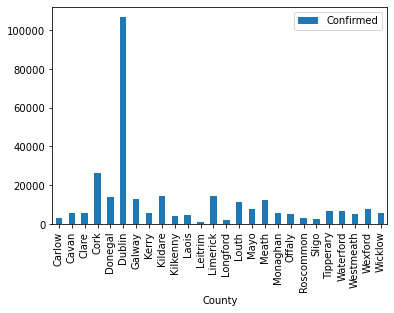

In [11]:
a = df.query('TimeStamp=="2021/07/31 00:00:00+00"').groupby('County')[['Confirmed', 'Deaths','Recovered']].sum().reset_index()
a.plot(x='County', y='Confirmed',kind='bar' )

In [12]:
df.query('TimeStamp=="2021/08/1 00:00:00+00"').groupby('County')[['Confirmed', 'Deaths','Recovered']].sum().reset_index()

,County,Confirmed,Deaths,Recovered
0,Carlow,3384,0.0,0.0
1,Cavan,5785,0.0,0.0
2,Clare,5614,0.0,0.0
3,Cork,26325,0.0,0.0
4,Donegal,14236,0.0,0.0
5,Dublin,107156,0.0,0.0


In [13]:
d = df.groupby(['TimeStamp','County']).sum().reset_index()
d.head(135)

,TimeStamp,County,OBJECTID,ORIGID,PopulationCensus16,IGEasting,IGNorthing,Lat,Long,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length
0,2020-02-27 00:00:00+00:00,Carlow,1,1,56932,278661,163444,52.7168,-6.8367,0,0.000000,0.0,0.0,2.432352e+09,3.193486e+05
1,2020-02-27 00:00:00+00:00,Cavan,2,2,76176,246380,304501,53.9878,-7.2937,0,0.000000,0.0,0.0,5.575010e+09,5.159545e+05
2,2020-02-27 00:00:00+00:00,Clare,3,3,118817,133493,182732,52.8917,-8.9889,0,0.000000,0.0,0.0,8.722542e+09,1.013949e+06
3,2020-02-27 00:00:00+00:00,Cork,4,4,542868,156242,77860,51.9517,-8.6372,0,0.000000,0.0,0.0,1.952949e+10,2.129949e+06
4,2020-02-27 00:00:00+00:00,Donegal,5,5,159192,202615,405691,54.8989,-7.9600,0,0.000000,0.0,0.0,1.462404e+10,2.145086e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130,2020-03-05 00:00:00+00:00,Carlow,131,1,56932,278661,163444,52.7168,-6.8367,0,0.000000,0.0,0.0,2.432352e+09,3.193486e+05
131,2020-03-05 00:00:00+00:00,Cavan,132,2,76176,246380,304501,53.9878,-7.2937,0,0.000000,0.0,0.0,5.575010e+09,5.159545e+05
132,2020-03-05 00:00:00+00:00,Clare,133,3,118817,133493,182732,52.8917,-8.9889,4,3.366522,0.0,0.0,8.722542e+09,1.013949e+06
133,2020-03-05 00:00:00+00:00,Cork,134,4,542868,156242,77860,51.9517,-8.6372,1,0.184207,0.0,0.0,1.952949e+10,2.129949e+06


In [14]:
# find the first position of not equal to zero.
df.Confirmed.ne(0).idxmax()

57

In [15]:
df.iloc[55:60]

,OBJECTID,ORIGID,County,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length
55,56,4,Cork,542868,2020-03-02 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,0,0.000000,NaN,NaN,1.952949e+10,2.129949e+06
56,57,5,Donegal,159192,2020-03-02 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,0,0.000000,NaN,NaN,1.462404e+10,2.145086e+06
57,58,6,Dublin,1347359,2020-03-02 00:00:00+00:00,313762,235813,53.3605,-6.2920,http://data.geohive.ie/resource/county/2ae1962...,1,0.074219,NaN,NaN,2.612633e+09,4.494335e+05
58,59,7,Galway,258058,2020-03-02 00:00:00+00:00,151045,235818,53.3705,-8.7362,http://data.geohive.ie/resource/county/2ae1962...,0,0.000000,NaN,NaN,1.707916e+10,1.972288e+06
59,60,8,Kerry,147707,2020-03-02 00:00:00+00:00,92975,102996,52.1689,-9.5650,http://data.geohive.ie/resource/county/2ae1962...,0,0.000000,NaN,NaN,1.248360e+10,1.753780e+06


In [16]:
#Wrong
df = df[(df['TimeStamp'] <= '2021-07-31 00:00:00+00:00')]
df.tail()

,OBJECTID,ORIGID,County,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length
13489,13490,22,Tipperary,159553,2021-07-31 00:00:00+00:00,205427,154345,52.6407,-7.9206,http://data.geohive.ie/resource/county/2ae1962...,6788,4254.385690,NaN,NaN,1.155120e+10,781276.579658
13490,13491,23,Waterford,116176,2021-07-31 00:00:00+00:00,234676,105809,52.2035,-7.4935,http://data.geohive.ie/resource/county/2ae1962...,6505,5599.263187,NaN,NaN,4.848380e+09,643184.903993
13491,13492,24,Westmeath,88770,2021-07-31 00:00:00+00:00,238362,255966,53.5524,-7.4219,http://data.geohive.ie/resource/county/2ae1962...,4969,5597.611806,NaN,NaN,5.208706e+09,422669.332716
13492,13493,25,Wexford,149722,2021-07-31 00:00:00+00:00,301627,141559,52.5164,-6.5037,http://data.geohive.ie/resource/county/2ae1962...,7992,5337.892895,NaN,NaN,6.332221e+09,589324.476745
13493,13494,26,Wicklow,142425,2021-07-31 00:00:00+00:00,311162,197894,53.0205,-6.3442,http://data.geohive.ie/resource/county/2ae1962...,5752,4038.616816,NaN,NaN,5.580729e+09,427539.198567


In [17]:
df

,OBJECTID,ORIGID,County,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length
0,1,1,Carlow,56932,2020-02-27 00:00:00+00:00,278661,163444,52.7168,-6.8367,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,2.432352e+09,3.193486e+05
1,2,2,Cavan,76176,2020-02-27 00:00:00+00:00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,5.575010e+09,5.159545e+05
2,3,3,Clare,118817,2020-02-27 00:00:00+00:00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,8.722542e+09,1.013949e+06
3,4,4,Cork,542868,2020-02-27 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.952949e+10,2.129949e+06
4,5,5,Donegal,159192,2020-02-27 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.462404e+10,2.145086e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13489,13490,22,Tipperary,159553,2021-07-31 00:00:00+00:00,205427,154345,52.6407,-7.9206,http://data.geohive.ie/resource/county/2ae1962...,6788,4254.385690,NaN,NaN,1.155120e+10,7.812766e+05
13490,13491,23,Waterford,116176,2021-07-31 00:00:00+00:00,234676,105809,52.2035,-7.4935,http://data.geohive.ie/resource/county/2ae1962...,6505,5599.263187,NaN,NaN,4.848380e+09,6.431849e+05
13491,13492,24,Westmeath,88770,2021-07-31 00:00:00+00:00,238362,255966,53.5524,-7.4219,http://data.geohive.ie/resource/county/2ae1962...,4969,5597.611806,NaN,NaN,5.208706e+09,4.226693e+05
13492,13493,25,Wexford,149722,2021-07-31 00:00:00+00:00,301627,141559,52.5164,-6.5037,http://data.geohive.ie/resource/county/2ae1962...,7992,5337.892895,NaN,NaN,6.332221e+09,5.893245e+05


## Visuals

In [18]:
confirmed = df.groupby('TimeStamp')['Confirmed'].sum().reset_index()
confirmed

,TimeStamp,Confirmed
0,2020-02-27 00:00:00+00:00,0
1,2020-03-01 00:00:00+00:00,0
2,2020-03-02 00:00:00+00:00,1
3,2020-03-03 00:00:00+00:00,2
4,2020-03-04 00:00:00+00:00,5
...,...,...
514,2021-07-27 00:00:00+00:00,295513
515,2021-07-28 00:00:00+00:00,296872
516,2021-07-29 00:00:00+00:00,298365
517,2021-07-30 00:00:00+00:00,299790


In [19]:
import matplotlib.pyplot as plt

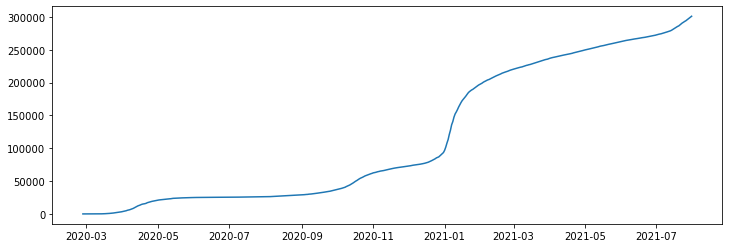

In [20]:
# removed the last day as it is incomplete
plt.figure(figsize=(12,4))
plt.plot(confirmed['TimeStamp'], confirmed['Confirmed'])

In [21]:
confirmed.tail()

,TimeStamp,Confirmed
514,2021-07-27 00:00:00+00:00,295513
515,2021-07-28 00:00:00+00:00,296872
516,2021-07-29 00:00:00+00:00,298365
517,2021-07-30 00:00:00+00:00,299790
518,2021-07-31 00:00:00+00:00,301075


In [22]:
import plotly.graph_objects as go
import plotly.express as px
import datetime

In [23]:
df['Date'] = [datetime.datetime.date(d) for d in df['TimeStamp']]
df['Date'] = df['Date'].astype(str)
df

<ipython-input-23-dcae6fdf54de>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Date'] = [datetime.datetime.date(d) for d in df['TimeStamp']]
<ipython-input-23-dcae6fdf54de>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Date'] = df['Date'].astype(str)


,OBJECTID,ORIGID,County,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length,Date
0,1,1,Carlow,56932,2020-02-27 00:00:00+00:00,278661,163444,52.7168,-6.8367,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,2.432352e+09,3.193486e+05,2020-02-27
1,2,2,Cavan,76176,2020-02-27 00:00:00+00:00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,5.575010e+09,5.159545e+05,2020-02-27
2,3,3,Clare,118817,2020-02-27 00:00:00+00:00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,8.722542e+09,1.013949e+06,2020-02-27
3,4,4,Cork,542868,2020-02-27 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.952949e+10,2.129949e+06,2020-02-27
4,5,5,Donegal,159192,2020-02-27 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.462404e+10,2.145086e+06,2020-02-27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13489,13490,22,Tipperary,159553,2021-07-31 00:00:00+00:00,205427,154345,52.6407,-7.9206,http://data.geohive.ie/resource/county/2ae1962...,6788,4254.385690,NaN,NaN,1.155120e+10,7.812766e+05,2021-07-31
13490,13491,23,Waterford,116176,2021-07-31 00:00:00+00:00,234676,105809,52.2035,-7.4935,http://data.geohive.ie/resource/county/2ae1962...,6505,5599.263187,NaN,NaN,4.848380e+09,6.431849e+05,2021-07-31
13491,13492,24,Westmeath,88770,2021-07-31 00:00:00+00:00,238362,255966,53.5524,-7.4219,http://data.geohive.ie/resource/county/2ae1962...,4969,5597.611806,NaN,NaN,5.208706e+09,4.226693e+05,2021-07-31
13492,13493,25,Wexford,149722,2021-07-31 00:00:00+00:00,301627,141559,52.5164,-6.5037,http://data.geohive.ie/resource/county/2ae1962...,7992,5337.892895,NaN,NaN,6.332221e+09,5.893245e+05,2021-07-31


In [24]:
fig = px.density_mapbox(df, 
                        lat="Lat", 
                        lon="Long", 
                        hover_name="County", 
                        z=df.Confirmed, 
                        animation_frame="Date",
                        radius=30,
                        range_color=(0,6000),
                        zoom=5,height=800)

fig.update_layout(title='Ireland Corona Virus Cases Time Lapse - Confirmed',
                  font=dict(family="Courier New, monospace",
                            size=20,
                            color="#7f7f7f")
                 )

fig.update_layout(mapbox_style="open-street-map")
# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})


fig.show()

In [25]:
df.Date.dtypes

dtype('O')

## Analysis by County

In [26]:
counties_affected = df.County.unique()
print('Number of counties affected: '+ str(len(counties_affected)))
print('Name of Counties affected: ')
for i in counties_affected:
    print(i)

Number of counties affected: 26
Name of Counties affected: 
Carlow
Cavan
Clare
Cork
Donegal
Dublin
Galway
Kerry
Kildare
Kilkenny
Laois
Leitrim
Limerick
Longford
Louth
Mayo
Meath
Monaghan
Offaly
Roscommon
Sligo
Tipperary
Waterford
Westmeath
Wexford
Wicklow


In [27]:
import pycountry

In [28]:
pycountry.countries.search_fuzzy('Ireland')

[Country(alpha_2='IE', alpha_3='IRL', name='Ireland', numeric='372'),
 Country(alpha_2='GB', alpha_3='GBR', name='United Kingdom', numeric='826', official_name='United Kingdom of Great Britain and Northern Ireland'),
 Country(alpha_2='PG', alpha_3='PNG', name='Papua New Guinea', numeric='598', official_name='Independent State of Papua New Guinea')]

In [29]:
ie = pycountry.subdivisions.get(country_code='IE')
len(ie)

30

In [30]:
print(ie)

{Subdivision(code='IE-LK', country_code='IE', name='Limerick', parent='M', parent_code='IE-M', type='County'), Subdivision(code='IE-LM', country_code='IE', name='Leitrim', parent='C', parent_code='IE-C', type='County'), Subdivision(code='IE-LS', country_code='IE', name='Laois', parent='L', parent_code='IE-L', type='County'), Subdivision(code='IE-M', country_code='IE', name='Munster', parent_code=None, type='Province'), Subdivision(code='IE-MH', country_code='IE', name='Meath', parent='L', parent_code='IE-L', type='County'), Subdivision(code='IE-MN', country_code='IE', name='Monaghan', parent='U', parent_code='IE-U', type='County'), Subdivision(code='IE-C', country_code='IE', name='Connacht', parent_code=None, type='Province'), Subdivision(code='IE-MO', country_code='IE', name='Mayo', parent='C', parent_code='IE-C', type='County'), Subdivision(code='IE-OY', country_code='IE', name='Offaly', parent='L', parent_code='IE-L', type='County'), Subdivision(code='IE-CE', country_code='IE', name

In [31]:
print(list(county.name for county in ie))

['Limerick', 'Leitrim', 'Laois', 'Munster', 'Meath', 'Monaghan', 'Connacht', 'Mayo', 'Offaly', 'Clare', 'Roscommon', 'Sligo', 'Cavan', 'Tipperary', 'Cork', 'Ulster', 'Carlow', 'Dublin', 'Waterford', 'Donegal', 'Galway', 'Westmeath', 'Kildare', 'Wicklow', 'Wexford', 'Kilkenny', 'Kerry', 'Leinster', 'Longford', 'Louth']


In [32]:
df

,OBJECTID,ORIGID,County,PopulationCensus16,TimeStamp,IGEasting,IGNorthing,Lat,Long,UGI,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length,Date
0,1,1,Carlow,56932,2020-02-27 00:00:00+00:00,278661,163444,52.7168,-6.8367,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,2.432352e+09,3.193486e+05,2020-02-27
1,2,2,Cavan,76176,2020-02-27 00:00:00+00:00,246380,304501,53.9878,-7.2937,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,5.575010e+09,5.159545e+05,2020-02-27
2,3,3,Clare,118817,2020-02-27 00:00:00+00:00,133493,182732,52.8917,-8.9889,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,8.722542e+09,1.013949e+06,2020-02-27
3,4,4,Cork,542868,2020-02-27 00:00:00+00:00,156242,77860,51.9517,-8.6372,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.952949e+10,2.129949e+06,2020-02-27
4,5,5,Donegal,159192,2020-02-27 00:00:00+00:00,202615,405691,54.8989,-7.9600,http://data.geohive.ie/resource/county/2ae1962...,0,NaN,NaN,NaN,1.462404e+10,2.145086e+06,2020-02-27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13489,13490,22,Tipperary,159553,2021-07-31 00:00:00+00:00,205427,154345,52.6407,-7.9206,http://data.geohive.ie/resource/county/2ae1962...,6788,4254.385690,NaN,NaN,1.155120e+10,7.812766e+05,2021-07-31
13490,13491,23,Waterford,116176,2021-07-31 00:00:00+00:00,234676,105809,52.2035,-7.4935,http://data.geohive.ie/resource/county/2ae1962...,6505,5599.263187,NaN,NaN,4.848380e+09,6.431849e+05,2021-07-31
13491,13492,24,Westmeath,88770,2021-07-31 00:00:00+00:00,238362,255966,53.5524,-7.4219,http://data.geohive.ie/resource/county/2ae1962...,4969,5597.611806,NaN,NaN,5.208706e+09,4.226693e+05,2021-07-31
13492,13493,25,Wexford,149722,2021-07-31 00:00:00+00:00,301627,141559,52.5164,-6.5037,http://data.geohive.ie/resource/county/2ae1962...,7992,5337.892895,NaN,NaN,6.332221e+09,5.893245e+05,2021-07-31


In [33]:
df2=df.groupby(['Date','County' ])[['Date','County', 'Confirmed']].sum().reset_index()
df2

,Date,County,Confirmed
0,2020-02-27,Carlow,0
1,2020-02-27,Cavan,0
2,2020-02-27,Clare,0
3,2020-02-27,Cork,0
4,2020-02-27,Donegal,0
...,...,...,...
13489,2021-07-31,Tipperary,6788
13490,2021-07-31,Waterford,6505
13491,2021-07-31,Westmeath,4969
13492,2021-07-31,Wexford,7992


In [34]:
df.groupby('Date').sum().reset_index()

,Date,OBJECTID,ORIGID,PopulationCensus16,IGEasting,IGNorthing,Lat,Long,Confirmed,Proportion,Deaths,Recovered,Shape__Area,Shape__Length
0,2020-02-27,351,351,4761865,5756196,5888739,1385.4073,-199.637,0,0.000000,0.0,0.0,1.935829e+11,2.114830e+07
1,2020-03-01,1027,351,4761865,5756196,5888739,1385.4073,-199.637,0,0.000000,0.0,0.0,1.935829e+11,2.114830e+07
2,2020-03-02,1703,351,4761865,5756196,5888739,1385.4073,-199.637,1,0.074219,0.0,0.0,1.935829e+11,2.114830e+07
3,2020-03-03,2379,351,4761865,5756196,5888739,1385.4073,-199.637,2,0.850111,0.0,0.0,1.935829e+11,2.114830e+07
4,2020-03-04,3055,351,4761865,5756196,5888739,1385.4073,-199.637,5,3.375002,0.0,0.0,1.935829e+11,2.114830e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
514,2021-07-27,347815,351,4761865,5756196,5888739,1385.4073,-199.637,295513,148337.815697,0.0,0.0,1.935829e+11,2.114830e+07
515,2021-07-28,348491,351,4761865,5756196,5888739,1385.4073,-199.637,296872,149030.490239,0.0,0.0,1.935829e+11,2.114830e+07
516,2021-07-29,349167,351,4761865,5756196,5888739,1385.4073,-199.637,298365,149789.076654,0.0,0.0,1.935829e+11,2.114830e+07
517,2021-07-30,349843,351,4761865,5756196,5888739,1385.4073,-199.637,299790,150522.021107,0.0,0.0,1.935829e+11,2.114830e+07


In [35]:
c=df.groupby(['Date','County'])[['Confirmed', 'Lat', 'Long']].sum().reset_index()
c

,Date,County,Confirmed,Lat,Long
0,2020-02-27,Carlow,0,52.7168,-6.8367
1,2020-02-27,Cavan,0,53.9878,-7.2937
2,2020-02-27,Clare,0,52.8917,-8.9889
3,2020-02-27,Cork,0,51.9517,-8.6372
4,2020-02-27,Donegal,0,54.8989,-7.9600
...,...,...,...,...,...
13489,2021-07-31,Tipperary,6788,52.6407,-7.9206
13490,2021-07-31,Waterford,6505,52.2035,-7.4935
13491,2021-07-31,Westmeath,4969,53.5524,-7.4219
13492,2021-07-31,Wexford,7992,52.5164,-6.5037


In [36]:
county_confirmed=df2.groupby(['Date','County']).sum()[['Confirmed']].reset_index()
county_confirmed

,Date,County,Confirmed
0,2020-02-27,Carlow,0
1,2020-02-27,Cavan,0
2,2020-02-27,Clare,0
3,2020-02-27,Cork,0
4,2020-02-27,Donegal,0
...,...,...,...
13489,2021-07-31,Tipperary,6788
13490,2021-07-31,Waterford,6505
13491,2021-07-31,Westmeath,4969
13492,2021-07-31,Wexford,7992


In [37]:
counties = {}
for county in ie:
    counties[county.name] = county
    
#confirmed2["iso_alpha"] = confirmed2["Country"].map(countries.get)
#deaths2["iso_alpha"] = deaths2["Country"].map(countries.get)
#recovered2["iso_alpha"] = recovered2["Country"].map(countries.get)

In [38]:
county_confirmed["iso_alpha"] = county_confirmed["County"].map(counties.get)

In [39]:
plot_data_confirmed = county_confirmed[["iso_alpha","Confirmed", "County"]]

In [40]:
import json
ireland_county = json.load(open('counties.geojson','r',encoding="utf-8"))

In [41]:
ireland_county

{'type': 'FeatureCollection',
 'crs': {'type': 'name',
  'properties': {'name': 'urn:ogc:def:crs:OGC:1.3:CRS84'}},
 'features': [{'type': 'Feature',
   'properties': {'OSM_ID': -335443.0,
    'NAME_TAG': 'Roscommon',
    'NAME_GA': 'Contae Ros ComÃ¡in',
    'NAME_EN': 'County Roscommon',
    'ALT_NAME': None,
    'ALT_NAME_G': None,
    'LOGAINM_RE': '100027',
    'OSM_USER': 'Polarbear',
    'OSM_TIMEST': '2009-11-24 21:11:53+01',
    'ATTRIBUTIO': None,
    'T_IE_URL': 'http://www.townlands.ie/roscommon',
    'AREA': 2548160898.58192,
    'LATITUDE': 53.7236686837838,
    'LONGITUDE': -8.24645969479626,
    'EPOCH_TSTM': 1259093513.0},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-8.8236844, 53.6656765],
      [-8.8235536, 53.6657595],
      [-8.8221616, 53.666475],
      [-8.8219817, 53.6665234],
      [-8.8218299, 53.6665345],
      [-8.8216781, 53.6665746],
      [-8.8215566, 53.6666562],
      [-8.8213955, 53.6669039],
      [-8.8212997, 53.6670174],
      [-8.8211549

In [42]:
ireland_county['features'][0].keys()

dict_keys(['type', 'properties', 'geometry'])

In [43]:
ireland_county['features'][0]

{'type': 'Feature',
 'properties': {'OSM_ID': -335443.0,
  'NAME_TAG': 'Roscommon',
  'NAME_GA': 'Contae Ros ComÃ¡in',
  'NAME_EN': 'County Roscommon',
  'ALT_NAME': None,
  'ALT_NAME_G': None,
  'LOGAINM_RE': '100027',
  'OSM_USER': 'Polarbear',
  'OSM_TIMEST': '2009-11-24 21:11:53+01',
  'ATTRIBUTIO': None,
  'T_IE_URL': 'http://www.townlands.ie/roscommon',
  'AREA': 2548160898.58192,
  'LATITUDE': 53.7236686837838,
  'LONGITUDE': -8.24645969479626,
  'EPOCH_TSTM': 1259093513.0},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[-8.8236844, 53.6656765],
    [-8.8235536, 53.6657595],
    [-8.8221616, 53.666475],
    [-8.8219817, 53.6665234],
    [-8.8218299, 53.6665345],
    [-8.8216781, 53.6665746],
    [-8.8215566, 53.6666562],
    [-8.8213955, 53.6669039],
    [-8.8212997, 53.6670174],
    [-8.8211549, 53.667088],
    [-8.8209867, 53.6671115],
    [-8.8208583, 53.66707],
    [-8.8206737, 53.6670091],
    [-8.8202603, 53.6670188],
    [-8.8200735, 53.6670603],
    [-8.8199007, 53

In [44]:
county_id_map= {}

for feature in ireland_county['features']:
    feature['id']=feature['properties']['NAME_EN']
    county_id_map[feature['properties']['NAME_TAG']]=feature['id']

In [45]:
county_id_map

{'Roscommon': 'County Roscommon',
 'Limerick': 'County Limerick',
 'Cavan': 'County Cavan',
 'Kilkenny': 'County Kilkenny',
 'Cork': 'County Cork',
 'Longford': 'County Longford',
 'Meath': 'County Meath',
 'Antrim': 'County Antrim',
 'Fermanagh': 'County Fermanagh',
 'Donegal': 'County Donegal',
 'Monaghan': 'County Monaghan',
 'Louth': 'County Louth',
 'Mayo': 'County Mayo',
 'Sligo': 'County Sligo',
 'Laois': 'County Laois',
 'Westmeath': 'County Westmeath',
 'Galway': 'County Galway',
 'Offaly': 'County Offaly',
 'Leitrim': 'County Leitrim',
 'Kerry': 'County Kerry',
 'Tyrone': 'County Tyrone',
 'Dublin': 'County Dublin',
 'Armagh': 'County Armagh',
 'Londonderry': None,
 'Down': 'County Down',
 'Clare': 'County Clare',
 'Tipperary': 'County Tipperary',
 'Waterford': 'County Waterford',
 'Wexford': 'County Wexford',
 'Carlow': 'County Carlow',
 'Kildare': 'County Kildare',
 'Wicklow': 'County Wicklow'}

In [46]:
county_confirmed['County'].nunique()

26

In [47]:
county_confirmed['id'] = county_confirmed['County'].apply(lambda x: county_id_map[x])

In [48]:
fig = px.choropleth(county_confirmed, locations='id',geojson='ireland_county', color='Confirmed', scope='europe')
fig.update_geos(fitbounds="locations", visible=False)
fig.show()

In [49]:
px.choropleth_mapbox(county_confirmed, locations='id',geojson='ireland_county', color='Confirmed')

In [50]:
county_confirmed

,Date,County,Confirmed,iso_alpha,id
0,2020-02-27,Carlow,0,"Subdivision(code='IE-CW', country_code='IE', n...",County Carlow
1,2020-02-27,Cavan,0,"Subdivision(code='IE-CN', country_code='IE', n...",County Cavan
2,2020-02-27,Clare,0,"Subdivision(code='IE-CE', country_code='IE', n...",County Clare
3,2020-02-27,Cork,0,"Subdivision(code='IE-CO', country_code='IE', n...",County Cork
4,2020-02-27,Donegal,0,"Subdivision(code='IE-DL', country_code='IE', n...",County Donegal
...,...,...,...,...,...
13489,2021-07-31,Tipperary,6788,"Subdivision(code='IE-TA', country_code='IE', n...",County Tipperary
13490,2021-07-31,Waterford,6505,"Subdivision(code='IE-WD', country_code='IE', n...",County Waterford
13491,2021-07-31,Westmeath,4969,"Subdivision(code='IE-WH', country_code='IE', n...",County Westmeath
13492,2021-07-31,Wexford,7992,"Subdivision(code='IE-WX', country_code='IE', n...",County Wexford


## Prepare to transform

In [51]:
confirmed_cases = df2.groupby('Date').sum()['Confirmed'].reset_index()

In [52]:
confirmed_cases

,Date,Confirmed
0,2020-02-27,0
1,2020-03-01,0
2,2020-03-02,1
3,2020-03-03,2
4,2020-03-04,5
...,...,...
514,2021-07-27,295513
515,2021-07-28,296872
516,2021-07-29,298365
517,2021-07-30,299790


In [53]:
confirmed_cases.columns = ['ds', 'y']
confirmed_cases['ds'] = pd.to_datetime(confirmed_cases['ds'])
confirmed_cases.head()

,ds,y
0,2020-02-27,0
1,2020-03-01,0
2,2020-03-02,1
3,2020-03-03,2
4,2020-03-04,5


In [54]:
confirmed_cases.tail()

,ds,y
514,2021-07-27,295513
515,2021-07-28,296872
516,2021-07-29,298365
517,2021-07-30,299790
518,2021-07-31,301075


## Forecasting

In [55]:
from fbprophet import Prophet

In [56]:
m = Prophet(interval_width=0.95)
m.fit(confirmed_cases)
future = m.make_future_dataframe(periods=20)
future_confirmed = future.copy()

future.tail()

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
534,2021-08-16
535,2021-08-17
536,2021-08-18
537,2021-08-19
538,2021-08-20


In [57]:
forecast = m.predict(future)
forecast.head()
#forecast[['ds', 'yhat','yhat_lower','yhat_upper']].tail()


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-02-27,-2692.822651,-7961.660136,2066.355900,-2692.822651,-2692.822651,85.728722,85.728722,85.728722,85.728722,85.728722,85.728722,0.0,0.0,0.0,-2607.093929
1,2020-03-01,-2102.730927,-6653.279596,2764.137486,-2102.730927,-2102.730927,-47.589175,-47.589175,-47.589175,-47.589175,-47.589175,-47.589175,0.0,0.0,0.0,-2150.320102
2,2020-03-02,-1906.033686,-6522.822656,3171.168352,-1906.033686,-1906.033686,-134.362548,-134.362548,-134.362548,-134.362548,-134.362548,-134.362548,0.0,0.0,0.0,-2040.396234
3,2020-03-03,-1709.336444,-6811.591698,3127.611808,-1709.336444,-1709.336444,-83.607882,-83.607882,-83.607882,-83.607882,-83.607882,-83.607882,0.0,0.0,0.0,-1792.944327
4,2020-03-04,-1512.639203,-5905.925123,3374.328648,-1512.639203,-1512.639203,-0.469795,-0.469795,-0.469795,-0.469795,-0.469795,-0.469795,0.0,0.0,0.0,-1513.108998


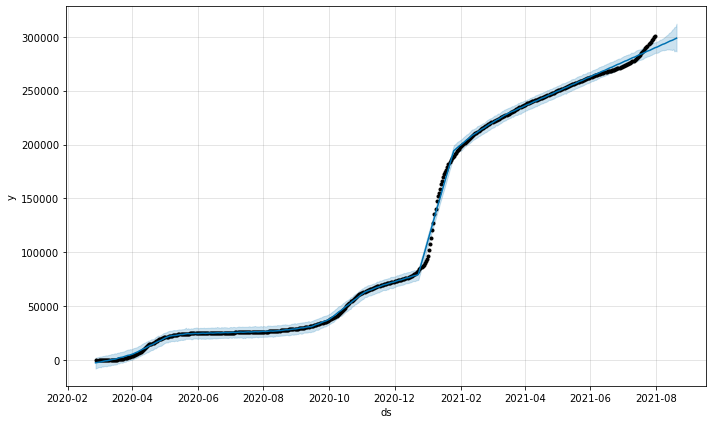

In [58]:
confirmed_forecast_plot = m.plot(forecast)

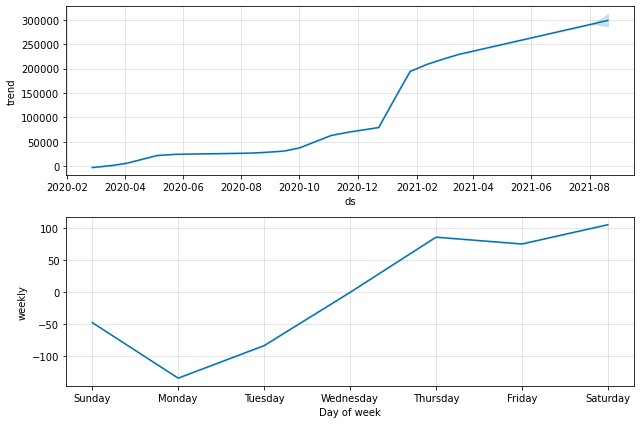

In [59]:
forecast_components = m.plot_components(forecast)

## Forecast per county

In [60]:
days_to_forcast = 7
first_forecasted_date = sorted(list(set(df2['Date'].values)))[-days_to_forcast]

def make_forecast(counties_affected, county_confirmed,days_to_forcast,
                  first_forecasted_date, mode):
    absolute_errors = []
    counter = 0
    
    for county in counties_affected:
        try:
            assert(county in county_confirmed['County'].values)
            print('County' + str(county) + ' is listed!')
            county_confirmed_df = county_confirmed[(county_confirmed['County']==
                                                    county)]
            county_dfs = [('Confirmed', county_confirmed_df)]
            
    

SyntaxError: unexpected EOF while parsing (<ipython-input-60-18cdf54518c3>, line 17)

In [61]:
county_confirmed = county_confirmed.rename(columns={'Date': 'ds', 'Confirmed':'y'})
county_grouped = county_confirmed.groupby('County')
final = pd.DataFrame(columns=['ds','yhat'])
for g in county_grouped.groups:
    county = county_grouped.get_group(g)
    m = Prophet()
    m.fit(county)
    future=m.make_future_dataframe(periods=20)
    forecast = m.predict(future)
    forecast['County']=g
    final = pd.concat([final,forecast],ignore_index=True)
    
final.head(10)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

,ds,yhat,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,County
0,2020-02-27,-33.460529,-33.814201,-82.442675,20.737108,-33.814201,-33.814201,0.353671,0.353671,0.353671,0.353671,0.353671,0.353671,0.0,0.0,0.0,Carlow
1,2020-03-01,-28.643345,-27.748945,-81.755720,22.994782,-27.748945,-27.748945,-0.894400,-0.894400,-0.894400,-0.894400,-0.894400,-0.894400,0.0,0.0,0.0,Carlow
2,2020-03-02,-27.232089,-25.727193,-80.637503,22.326791,-25.727193,-25.727193,-1.504896,-1.504896,-1.504896,-1.504896,-1.504896,-1.504896,0.0,0.0,0.0,Carlow
3,2020-03-03,-25.007718,-23.705441,-79.244819,29.106212,-23.705441,-23.705441,-1.302278,-1.302278,-1.302278,-1.302278,-1.302278,-1.302278,0.0,0.0,0.0,Carlow
4,2020-03-04,-21.234132,-21.683689,-71.671741,26.732099,-21.683689,-21.683689,0.449556,0.449556,0.449556,0.449556,0.449556,0.449556,0.0,0.0,0.0,Carlow
5,2020-03-05,-19.308265,-19.661936,-73.056133,31.997294,-19.661936,-19.661936,0.353671,0.353671,0.353671,0.353671,0.353671,0.353671,0.0,0.0,0.0,Carlow
6,2020-03-06,-16.251284,-17.640184,-64.897168,38.451219,-17.640184,-17.640184,1.388900,1.388900,1.388900,1.388900,1.388900,1.388900,0.0,0.0,0.0,Carlow
7,2020-03-07,-14.108986,-15.618432,-64.480953,37.922783,-15.618432,-15.618432,1.509446,1.509446,1.509446,1.509446,1.509446,1.509446,0.0,0.0,0.0,Carlow
8,2020-03-08,-14.491081,-13.596680,-69.120784,36.464724,-13.596680,-13.596680,-0.894400,-0.894400,-0.894400,-0.894400,-0.894400,-0.894400,0.0,0.0,0.0,Carlow
9,2020-03-09,-13.079824,-11.574928,-65.766431,37.365576,-11.574928,-11.574928,-1.504896,-1.504896,-1.504896,-1.504896,-1.504896,-1.504896,0.0,0.0,0.0,Carlow


In [65]:
df_carlow = final[final.County == 'Carlow']

In [67]:
df_carlow.reset_index()

,index,ds,yhat,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,County
0,0,2020-02-27,-33.460529,-33.814201,-82.442675,20.737108,-33.814201,-33.814201,0.353671,0.353671,0.353671,0.353671,0.353671,0.353671,0.0,0.0,0.0,Carlow
1,1,2020-03-01,-28.643345,-27.748945,-81.755720,22.994782,-27.748945,-27.748945,-0.894400,-0.894400,-0.894400,-0.894400,-0.894400,-0.894400,0.0,0.0,0.0,Carlow
2,2,2020-03-02,-27.232089,-25.727193,-80.637503,22.326791,-25.727193,-25.727193,-1.504896,-1.504896,-1.504896,-1.504896,-1.504896,-1.504896,0.0,0.0,0.0,Carlow
3,3,2020-03-03,-25.007718,-23.705441,-79.244819,29.106212,-23.705441,-23.705441,-1.302278,-1.302278,-1.302278,-1.302278,-1.302278,-1.302278,0.0,0.0,0.0,Carlow
4,4,2020-03-04,-21.234132,-21.683689,-71.671741,26.732099,-21.683689,-21.683689,0.449556,0.449556,0.449556,0.449556,0.449556,0.449556,0.0,0.0,0.0,Carlow
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
534,534,2021-08-16,3320.271255,3321.776151,3253.993145,3383.241502,3284.957724,3347.243465,-1.504896,-1.504896,-1.504896,-1.504896,-1.504896,-1.504896,0.0,0.0,0.0,Carlow
535,535,2021-08-17,3324.779192,3326.081470,3254.249707,3387.373031,3284.845651,3355.880664,-1.302278,-1.302278,-1.302278,-1.302278,-1.302278,-1.302278,0.0,0.0,0.0,Carlow
536,536,2021-08-18,3330.836344,3330.386788,3259.606163,3398.285525,3284.063698,3366.013537,0.449556,0.449556,0.449556,0.449556,0.449556,0.449556,0.0,0.0,0.0,Carlow
537,537,2021-08-19,3335.045778,3334.692106,3265.089986,3403.197434,3282.622442,3375.497395,0.353671,0.353671,0.353671,0.353671,0.353671,0.353671,0.0,0.0,0.0,Carlow


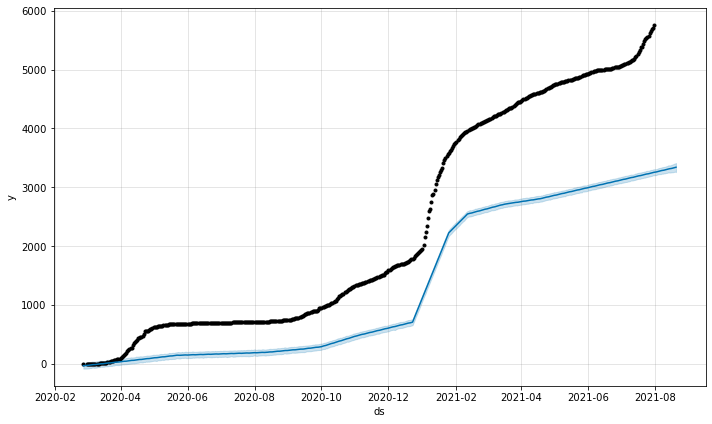

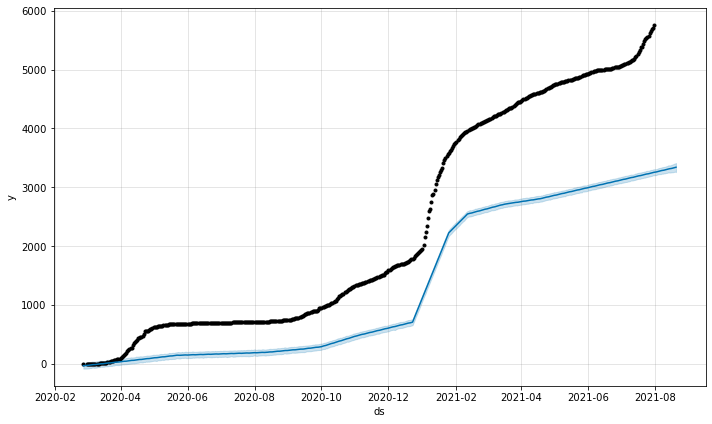

In [76]:
df_carlow[['ds', 'yhat','yhat_lower','yhat_upper']].tail()
m.plot(df_carlow)

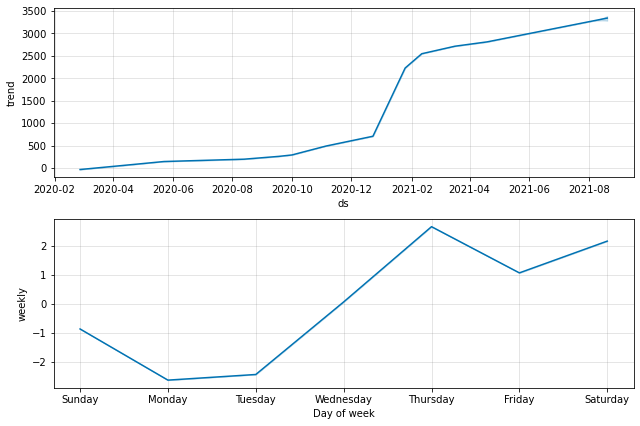

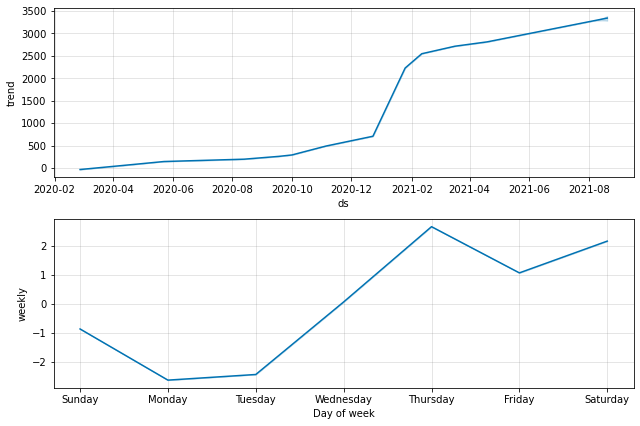

In [69]:
m.plot_components(df_carlow)